In [1]:
from functools import partial
import logging
import os
import sys
import jax
import haiku as hk
import numpy as np
import dask
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import colormaps as cm
import pandas as pd

from graphcast import rollout

from graphufs.training import construct_wrapped_graphcast
from graphufs.batchloader import ExpandedBatchLoader
from graphufs.datasets import Dataset
from graphufs.inference import swap_batch_time_dims, store_container

In [2]:
def plot_map(data_array, projection=ccrs.PlateCarree(), ax=None, add_coastlines=True, 
             add_borders=False, add_gridlines=True, **kwargs):
    """
    Plots geospatial data from an xarray DataArray using Cartopy.

    Args:
        data_array (xr.DataArray): The xarray DataArray containing the geospatial data.
        projection (cartopy.crs.Projection): The map projection to use. Defaults to PlateCarree.
        ax (matplotlib.axes.Axes, optional): Matplotlib axes to plot on. If None, a new figure and axes are created. Defaults to None.
        add_coastlines (bool, optional): Whether to add coastlines. Defaults to True.
        add_borders (bool, optional): Whether to add country borders. Defaults to False.
        add_gridlines (bool, optional): Whether to add gridlines. Defaults to True.
        **kwargs: Additional keyword arguments to pass to xarray.plot.
    """

    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(10, 5), subplot_kw={'projection': projection})
    else:
        fig = ax.get_figure()

    # Use xarray's plotting functionality with Cartopy axes
    data_array.plot(ax=ax, transform=ccrs.PlateCarree(), **kwargs)

    if add_coastlines:
        ax.coastlines()
    if add_borders:
        ax.add_feature(cfeature.BORDERS, linestyle='-')
    if add_gridlines:
        agl = ax.gridlines(draw_labels=True)
        agl.top_labels = False
        agl.right_labels = False
        
    return fig, ax

In [3]:
def predict_custom(
    emulator,
    dataset,
    idx=0,
    ckpt_id=64,
) -> xr.Dataset:
    
    #params, state = emulator.load_checkpoint(id=ckpt_id)
    # if ocn-only
    params, state = emulator.load_checkpoint_ocn_only(id=ckpt_id)
    
    @hk.transform_with_state
    def run_forward(inputs, targets_template, forcings):
        predictor = construct_wrapped_graphcast(emulator)
        return predictor(inputs, targets_template=targets_template, forcings=forcings)

    def with_params(fn):
        return partial(fn, params=params, state=state)

    def drop_state(fn):
        return lambda **kw: fn(**kw)[0]

    gc = drop_state(with_params(jax.jit(run_forward.apply)))

    inputs, targets, forcings = dataset.get_xarrays(idx)
    inputs.load()
    targets.load()
    forcings.load()

    # retrieve and drop t0
    inittimes = np.atleast_1d(inputs.datetime.isel(time=-1).values)
    inputs = inputs.drop_vars("datetime")
    targets = targets.drop_vars("datetime")
    forcings = forcings.drop_vars("datetime")

    predictions = rollout.chunked_prediction(
        gc,
        rng=jax.random.PRNGKey(0),
        inputs=inputs,
        targets_template=np.nan * targets,
        forcings=forcings,
    )

    # perform output transform, e.g. exp( log_spfh )
    for key, mapping in emulator.output_transforms.items():
        with xr.set_options(keep_attrs=True):
            predictions[key] = mapping(predictions[key])
            targets[key] = mapping(targets[key])
                
    # Add t0 as new variable, and swap out for logical sample/batch index
    predictions = swap_batch_time_dims(predictions, inittimes)
    targets = swap_batch_time_dims(targets, inittimes)

    return predictions, targets

In [4]:
# Open the existing ocean zarr-store
ocn = xr.open_zarr(
    "gs://noaa-ufs-gefsv13replay/ufs-hr1/0.25-degree-subsampled/06h-freq/zarr/mom6.zarr",
    storage_options={"token": "anon"},
)
ocn

<xarray.Dataset> Size: 5TB
Dimensions:       (time: 43826, lat: 192, lon: 384, zl: 75, z_l: 75)
Coordinates:
    cftime        (time) object 351kB dask.array<chunksize=(21913,), meta=np.ndarray>
    ftime         (time) timedelta64[ns] 351kB dask.array<chunksize=(21913,), meta=np.ndarray>
  * lat           (lat) float64 2kB 89.82 88.89 87.95 ... -87.25 -88.18 -89.12
  * lon           (lon) float64 3kB 0.0 0.9375 1.875 2.812 ... 357.2 358.1 359.1
  * time          (time) datetime64[ns] 351kB 1993-12-31T18:00:00 ... 2023-12-31
  * z_l           (z_l) float64 600B 0.5154 1.571 2.687 ... 5.698e+03 5.902e+03
  * zl            (zl) float64 600B 1.0 3.0 5.0 ... 3.591e+03 5.111e+03
Data variables: (12/20)
    Heat_PmE      (time, lat, lon) float32 13GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    LW            (time, lat, lon) float32 13GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    LwLatSens     (time, lat, lon) float32 13GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    SSH           (time, lat, lon) float32 13GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    SW            (time, lat, lon) float32 13GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    evap          (time, lat, lon) float32 13GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    ...            ...
    so            (time, z_l, lat, lon) float32 969GB dask.array<chunksize=(1, 75, 192, 384), meta=np.ndarray>
    taux          (time, lat, lon) float32 13GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    tauy          (time, lat, lon) float32 13GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    temp          (time, z_l, lat, lon) float32 969GB dask.array<chunksize=(1, 75, 192, 384), meta=np.ndarray>
    uo            (time, z_l, lat, lon) float32 969GB dask.array<chunksize=(1, 75, 192, 384), meta=np.ndarray>
    vo            (time, z_l, lat, lon) float32 969GB dask.array<chunksize=(1, 75, 192, 384), meta=np.ndarray>
Attributes:
    abstract:         The NOAA Unified Forecast System (UFS) / Global Ensembl...
    acknowledgement:  To provide appropriate attribution under this license, ...
    description:      This zarr store is a subset of the original GEFSv13 UFS...
    license:          The Global Ensemble Forecast System version 13 (GEFSv13...

In [5]:
# Open the existing atm zarr-store
atm = xr.open_zarr(
    "gs://noaa-ufs-gefsv13replay/ufs-hr1/0.25-degree-subsampled/03h-freq/zarr/fv3.zarr",
    storage_options={"token": "anon"},
)
atm

<xarray.Dataset> Size: 60TB
Dimensions:        (time: 87020, grid_yt: 192, grid_xt: 384, pfull: 127)
Coordinates:
    cftime         (time) object 696kB dask.array<chunksize=(21755,), meta=np.ndarray>
    ftime          (time) timedelta64[ns] 696kB dask.array<chunksize=(21755,), meta=np.ndarray>
  * grid_xt        (grid_xt) float64 3kB 0.0 0.9375 1.875 ... 357.2 358.1 359.1
  * grid_yt        (grid_yt) float64 2kB 89.82 88.89 87.95 ... -88.18 -89.12
  * pfull          (pfull) float32 508B 0.01278 0.02033 0.03177 ... 996.2 998.8
  * time           (time) datetime64[ns] 696kB 1993-12-31T18:00:00 ... 2023-1...
Data variables: (12/183)
    acond          (time, grid_yt, grid_xt) float32 26GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    albdo_ave      (time, grid_yt, grid_xt) float32 26GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    alnsf          (time, grid_yt, grid_xt) float32 26GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    alnwf          (time, grid_yt, grid_xt) float32 26GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    alvsf          (time, grid_yt, grid_xt) float32 26GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    alvwf          (time, grid_yt, grid_xt) float32 26GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    ...             ...
    xtts           (time, grid_yt, grid_xt) float32 26GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    xu             (time, grid_yt, grid_xt) float32 26GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    xv             (time, grid_yt, grid_xt) float32 26GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    xz             (time, grid_yt, grid_xt) float32 26GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    xzts           (time, grid_yt, grid_xt) float32 26GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    zc             (time, grid_yt, grid_xt) float32 26GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
Attributes:
    abstract:         The NOAA Unified Forecast System (UFS) / Global Ensembl...
    acknowledgement:  To provide appropriate attribution under this license, ...
    description:      This zarr store is a subset of the original GEFSv13 UFS...
    license:          The Global Ensemble Forecast System version 13 (GEFSv13...

In [6]:
from prototypes.ocn_only.R4.config import OcnEvaluator as Emulator
emulator = Emulator()

In [7]:
vds = Dataset(
    emulator,
    mode="validation",
    preload_batch=False,
)

In [8]:
vds.xds

<xarray.Dataset> Size: 49GB
Dimensions:       (datetime: 2601, lat: 192, lon: 384, level: 1, z_l: 7, z_i: 8)
Coordinates:
  * level         (level) float64 8B 974.3
    cftime        (datetime) object 21kB dask.array<chunksize=(2601,), meta=np.ndarray>
    ftime         (datetime) timedelta64[ns] 21kB dask.array<chunksize=(2601,), meta=np.ndarray>
  * lon           (lon) float64 3kB 0.0 0.9375 1.875 2.812 ... 357.2 358.1 359.1
  * lat           (lat) float64 2kB 89.82 88.89 87.95 ... -87.25 -88.18 -89.12
  * datetime      (datetime) datetime64[ns] 21kB 2022-01-01 ... 2023-10-13
  * z_i           (z_i) float64 64B 0.0 1.031 21.09 73.32 ... 190.2 352.3 483.1
  * z_l           (z_l) float64 56B 0.5154 11.06 47.21 93.67 152.1 271.2 417.7
Data variables: (12/14)
    spfh2m        (datetime, lat, lon) float32 767MB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    ugrd10m       (datetime, lat, lon) float32 767MB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    land_static   (lat, lon) float32 295kB dask.array<chunksize=(192, 384), meta=np.ndarray>
    spfh          (datetime, level, lat, lon) float32 767MB dask.array<chunksize=(1, 1, 192, 384), meta=np.ndarray>
    vgrd10m       (datetime, lat, lon) float32 767MB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    tmp           (datetime, level, lat, lon) float32 767MB dask.array<chunksize=(1, 1, 192, 384), meta=np.ndarray>
    ...            ...
    so            (z_l, datetime, lat, lon) float64 11GB dask.array<chunksize=(7, 1, 192, 384), meta=np.ndarray>
    temp          (z_l, datetime, lat, lon) float64 11GB dask.array<chunksize=(7, 1, 192, 384), meta=np.ndarray>
    vo            (z_l, datetime, lat, lon) float64 11GB dask.array<chunksize=(7, 1, 192, 384), meta=np.ndarray>
    LW            (datetime, lat, lon) float32 767MB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    SSH           (datetime, lat, lon) float32 767MB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    SW            (datetime, lat, lon) float32 767MB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>

In [9]:
predictions = {}
targets = {}
predictions, targets = predict_custom(emulator=emulator, dataset=vds, ckpt_id=4)

/global/homes/n/nagarwal/graph-ufs/graphcast/graphcast/rollout.py:127: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  num_target_steps = targets_template.dims["time"]
/global/homes/n/nagarwal/graph-ufs/graphcast/graphcast/autoregressive.py:200: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  scan_length = targets_template.dims['time']
/global/homes/n/nagarwal/graph-ufs/graphcast/graphcast/autoregressive.py:115: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping

In [10]:
predictions

<xarray.Dataset> Size: 342MB
Dimensions:    (lead_time: 40, time: 1, lat: 192, lon: 384, z_l: 7)
Coordinates:
  * lon        (lon) float64 3kB 0.0 0.9375 1.875 2.812 ... 357.2 358.1 359.1
  * lat        (lat) float64 2kB 89.82 88.89 87.95 ... -87.25 -88.18 -89.12
  * z_l        (z_l) float64 56B 0.5154 11.06 47.21 93.67 152.1 271.2 417.7
  * lead_time  (lead_time) timedelta64[ns] 320B 0 days 06:00:00 ... 10 days 0...
  * time       (time) datetime64[ns] 8B 2022-01-01
Data variables:
    SSH        (lead_time, time, lat, lon) float32 12MB -0.6131 ... -0.865
    so         (lead_time, time, z_l, lat, lon) float32 83MB 31.21 ... 0.06871
    temp       (lead_time, time, z_l, lat, lon) float32 83MB -1.689 ... -0.06958
    uo         (lead_time, time, z_l, lat, lon) float32 83MB -0.01777 ... 0.0...
    vo         (lead_time, time, z_l, lat, lon) float32 83MB -0.01026 ... 0.0...

In [24]:
predictions.to_zarr(pname, mode="w", consolidated=True)

In [25]:
targets.to_zarr(tname, mode="w", consolidated=True)

## Surface Pressure

In [11]:
itime = 0
ilead = -1

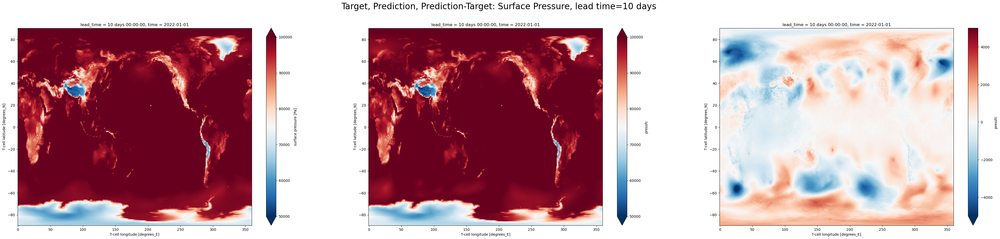

In [10]:
prediction = predictions.pressfc.isel(time=itime, lead_time=ilead)
target = targets.pressfc.isel(time=itime, lead_time=ilead)
diff = prediction - target

# plot
vmin=50000; vmax=100000
fig, ax = plt.subplots(1, 3, figsize=(50,10),)
target.plot(ax=ax[0], cmap="RdBu_r", vmin=vmin, vmax=vmax)
prediction.plot(ax=ax[1], cmap="RdBu_r", vmin=vmin, vmax=vmax)
diff.plot(ax=ax[2], cmap='RdBu_r', vmin=-5000, vmax=5000)

lead_time_days = prediction.lead_time.values.astype('timedelta64[D]')
plt.suptitle(f'Target, Prediction, Prediction-Target: Surface Pressure, lead time={lead_time_days}', fontsize=24)

plt.show()

## Specific Humidity

In [11]:
itime = 0
ilead = -1

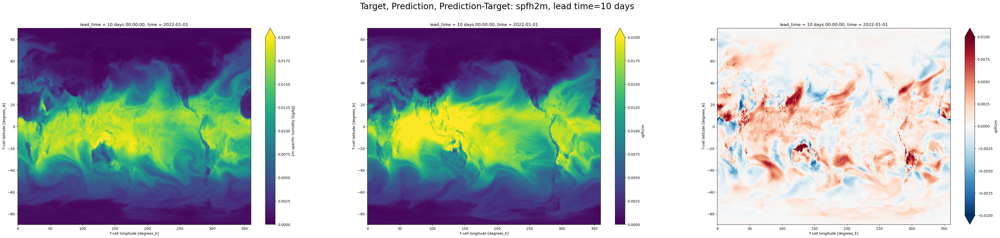

In [12]:
prediction = predictions.spfh2m.isel(time=itime, lead_time=ilead)
target = targets.spfh2m.isel(time=itime, lead_time=ilead)
diff = prediction - target
vmin = 0; vmax=0.02

# plot
fig, ax = plt.subplots(1, 3, figsize=(50,10))
target.plot(ax=ax[0], cmap="viridis", vmin=vmin, vmax=vmax, )
prediction.plot(ax=ax[1], cmap="viridis", vmin=vmin, vmax=vmax,)
diff.plot(ax=ax[2], cmap='RdBu_r', vmin=-0.01, vmax=0.01)

lead_time_days = prediction.lead_time.values.astype('timedelta64[D]')
plt.suptitle(f'Target, Prediction, Prediction-Target: spfh2m, lead time={lead_time_days}', fontsize=24)
plt.show()

In [13]:
ilevel = -1

In [14]:
prediction = predictions.spfh.isel(time=itime, lead_time=ilead, level=ilevel,)
target = targets.spfh.isel(time=itime, lead_time=ilead, level=ilevel)
diff = prediction - target

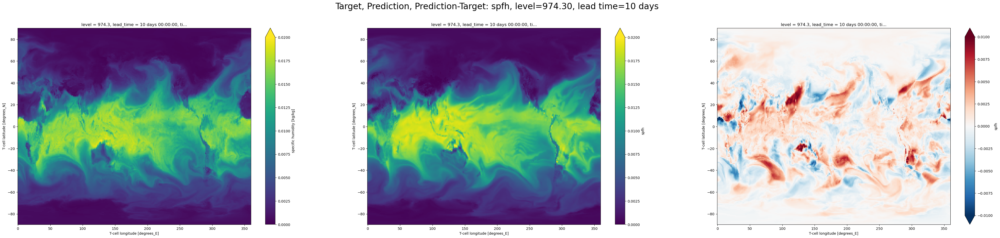

In [15]:
# plot
fig, ax = plt.subplots(1, 3, figsize=(50,10))
vmin = 0; vmax=0.02
target.plot(ax=ax[0], cmap="viridis", vmin=vmin, vmax=vmax)
prediction.plot(ax=ax[1], cmap="viridis", vmin=vmin, vmax=vmax)
diff.plot(ax=ax[2], cmap='RdBu_r', vmin=-0.01, vmax=0.01)

lead_time_days = prediction.lead_time.values.astype('timedelta64[D]')
plt.suptitle(f'Target, Prediction, Prediction-Target: spfh, level={prediction.level.values:.2f}, lead time={lead_time_days}', fontsize=24)
plt.show()

## Temperature

In [16]:
itime = 0
ilead = -1
ilevel = -1

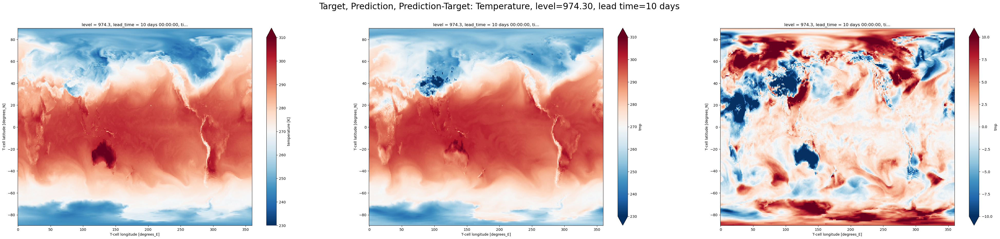

In [17]:
prediction = predictions.tmp.isel(time=itime, lead_time=ilead, level=ilevel)
target = targets.tmp.isel(time=itime, lead_time=ilead, level=ilevel)
diff = prediction - target
vmin=230; vmax=310

# plot
fig, ax = plt.subplots(1, 3, figsize=(50,10))
target.plot(ax=ax[0], cmap="RdBu_r", vmin=vmin, vmax=vmax)
prediction.plot(ax=ax[1], cmap="RdBu_r", vmin=vmin, vmax=vmax)
diff.plot(ax=ax[2], cmap='RdBu_r', vmin=-10, vmax=10)

lead_time_days = prediction.lead_time.values.astype('timedelta64[D]')
plt.suptitle(f'Target, Prediction, Prediction-Target: Temperature, level={prediction.level.values:.2f}, lead time={lead_time_days}', fontsize=24)
plt.show()

### tmpsfc

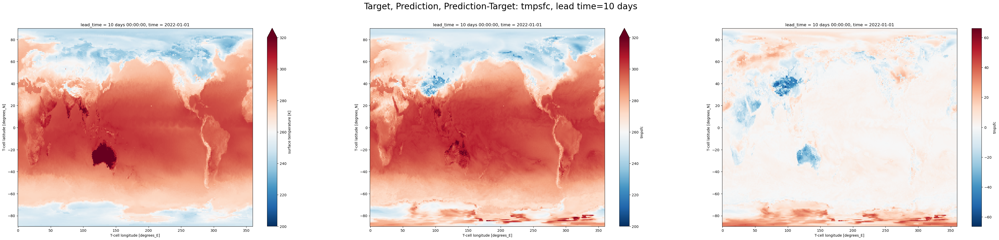

In [18]:
prediction = predictions.tmpsfc.isel(time=itime, lead_time=ilead,)
target = targets.tmpsfc.isel(time=itime, lead_time=ilead,)
diff = prediction - target

# plot
vmin=200; vmax=320
fig, ax = plt.subplots(1, 3, figsize=(50,10))
target.plot(ax=ax[0], cmap="RdBu_r", vmin=vmin, vmax=vmax)
prediction.plot(ax=ax[1], cmap="RdBu_r", vmin=vmin, vmax=vmax)
diff.plot(ax=ax[2], cmap='RdBu_r')

lead_time_days = prediction.lead_time.values.astype('timedelta64[D]')
plt.suptitle(f'Target, Prediction, Prediction-Target: tmpsfc, lead time={lead_time_days}', fontsize=24)
plt.show()

# Oceans

## SSH

In [13]:
itime = 0 #np.random.randint(0, ds_pred.sizes["time"]) # randomly select an initialization time
ileadtime = -1
leadtime = int(predictions.lead_time[ileadtime].values/3600/1e9)
variable = "SSH"

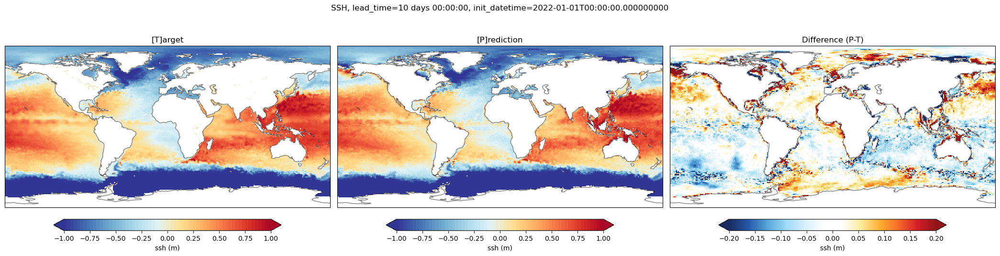

In [14]:
fig, axs = plt.subplots(1, 3, figsize=(21,5.5), subplot_kw=dict(projection=ccrs.PlateCarree()))
kwargs = {"cbar_kwargs":{"orientation": "horizontal", "shrink":0.7, "label":"ssh (m)", "pad":0.05}, 
          "robust":True, "cmap":cm.cmp_b2r, "vmin":-1, "vmax":1,}

ocean_mask = 1-atm.land_static.rename({"grid_xt":"lon", "grid_yt":"lat"})

# target
target = targets[variable].isel(time=itime, lead_time=ileadtime,).where(ocean_mask)
target.plot(ax=axs[0], transform=ccrs.PlateCarree(), **kwargs)
axs[0].coastlines(alpha=0.5)
axs[0].set_title("[T]arget")

# prediction
ocean_mask = 1-ocn.landsea_mask.isel(z_l=0,)
prediction = predictions[variable].isel(time=itime, lead_time=ileadtime,).where(ocean_mask)
prediction.plot(ax=axs[1], transform=ccrs.PlateCarree(), **kwargs)
axs[1].coastlines(alpha=0.5)
axs[1].set_title("[P]rediction")

# difference
diff = prediction - target
kwargs["cmap"]=cm.BlueWhiteOrangeRed
kwargs["vmin"]=-0.2
kwargs["vmax"]=0.2
diff.plot(ax=axs[2], transform=ccrs.PlateCarree(), **kwargs)
axs[2].coastlines(alpha=0.5)
axs[2].set_title("Difference (P-T)")

leadtime = pd.to_timedelta(prediction.lead_time.values, unit="D")
plt.suptitle(f"{variable}, lead_time={leadtime}, init_datetime={prediction.time.values}")
plt.tight_layout()
#plt.savefig(os.path.join("figures", f"{variable}_ocn_only_R0.png"), dpi=300)
plt.show()

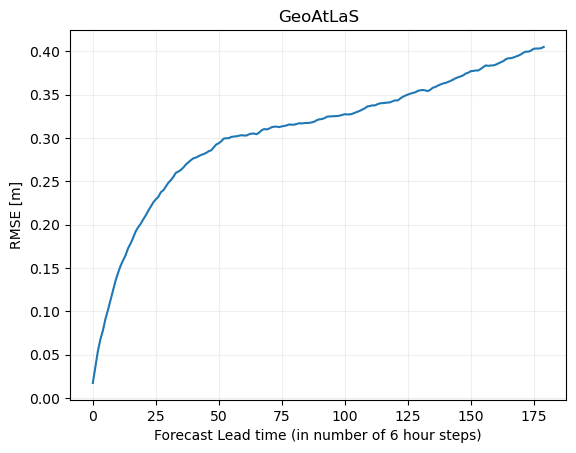

In [11]:
# compute rmse error vs lead time
mask = xr.where(targets.SSH==0, 0, 1)
sqerror = (targets.SSH - predictions.SSH*mask)**2
plt.plot(np.sqrt(sqerror.mean(dim=('time','lat', 'lon'))))
plt.ylabel('RMSE [m]')
plt.xlabel('Forecast Lead time (in number of 6 hour steps)')
plt.title ("GeoAtLaS")
plt.grid(alpha=0.2)
plt.show()

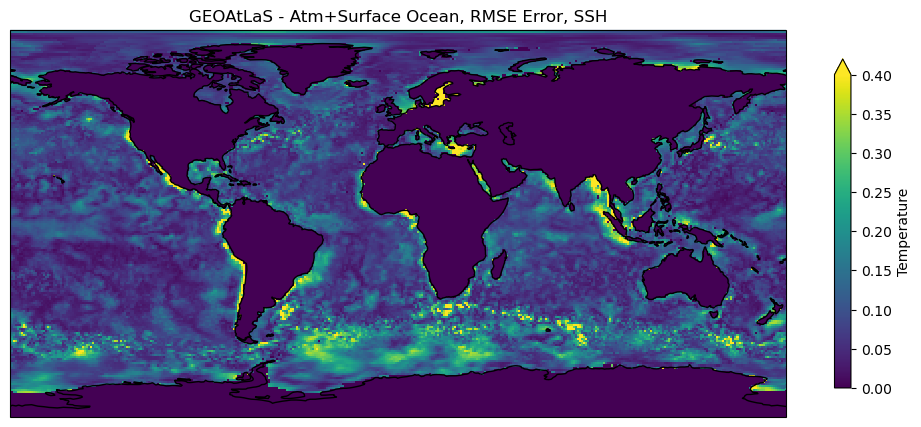

In [33]:
# spatial plot of RMSE error
mask = xr.where(targets.SSH==0, 0, 1)
sqerror = (targets.SSH - predictions.SSH*mask)**2
rmse_error = np.sqrt(sqerror.mean(dim=('lead_time','time')))
vmin=0; vmax = 0.4

# plot
kwargs = {"cbar_kwargs":{"orientation": "vertical", "shrink":0.7, "label":f"Temperature", "pad":0.05}, 
          "robust":True, "cmap":"viridis", "vmin":vmin, "vmax":vmax, "add_gridlines":False}
fig, ax = plot_map(rmse_error, **kwargs)
title = f"GEOAtLaS - Atm+Surface Ocean, RMSE Error, SSH"
ax.set_title(title)
plt.tight_layout()
plt.show()

## Temp

In [33]:
itime = 0 #np.random.randint(0, ds_pred.sizes["time"]) # randomly select an initialization time
ileadtime = 19
iz_l = 6
variable = "temp"

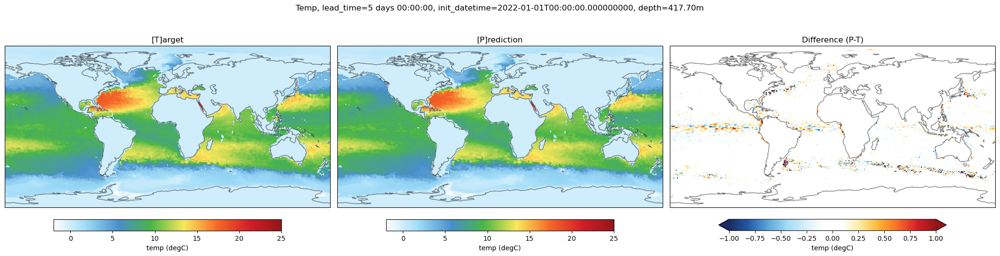

In [34]:
fig, axs = plt.subplots(1, 3, figsize=(21,5.5), subplot_kw=dict(projection=ccrs.PlateCarree()))
kwargs = {"cbar_kwargs":{"orientation": "horizontal", "shrink":0.7, "label":f"{variable} (degC)", "pad":0.05}, 
          "robust":True, "cmap":cm.WhiteBlueGreenYellowRed	, "vmin":-2, "vmax":25,}

ocean_mask = xr.where(targets.so.isel(time=0, lead_time=0, z_l=iz_l)==0, 0, 1)

# target
target = targets[variable].isel(time=itime, lead_time=ileadtime, z_l=iz_l)*ocean_mask
target.plot(ax=axs[0], transform=ccrs.PlateCarree(), **kwargs)
axs[0].coastlines(alpha=0.5)
axs[0].set_title("[T]arget")

# prediction
prediction = predictions[variable].isel(time=itime, lead_time=ileadtime, z_l=iz_l)*ocean_mask
prediction.plot(ax=axs[1], transform=ccrs.PlateCarree(), **kwargs)
axs[1].coastlines(alpha=0.5)
axs[1].set_title("[P]rediction")

# difference
diff = prediction - target
kwargs["cmap"]=cm.BlueWhiteOrangeRed
kwargs["vmin"]=-1
kwargs["vmax"]=1
diff.plot(ax=axs[2], transform=ccrs.PlateCarree(), **kwargs)
axs[2].coastlines(alpha=0.5)
axs[2].set_title("Difference (P-T)")

leadtime = pd.to_timedelta(predictions.coords["lead_time"][ileadtime].values, unit="D")
initdate = predictions.coords["time"][itime].values
plt.suptitle(f"Temp, lead_time={leadtime}, init_datetime={initdate}, depth={predictions.z_l[iz_l].values:.2f}m")
plt.tight_layout()
#plt.savefig(os.path.join("figures", f"{variable}_ocn_only_R3_z_l-{predictions.z_l[iz_l].values:.2f}.png"), dpi=300)
plt.show()

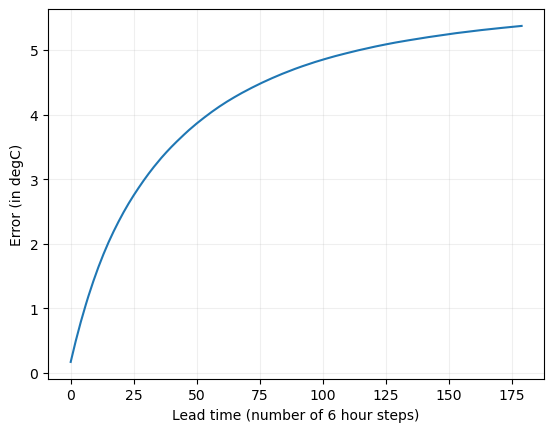

In [13]:
# compute rmse error vs lead time
mask = xr.where(targets.temp.isel(z_l=iz_l)==0, 0, 1)
sqerror = (targets.temp.isel(z_l=iz_l) - predictions.temp.isel(z_l=iz_l)*mask)**2
plt.plot(np.sqrt(sqerror.mean(dim=('time','lat', 'lon'))))
plt.ylabel('Error (in degC)')
plt.xlabel('Lead time (number of 6 hour steps)')
plt.grid(alpha=0.2)
plt.show()

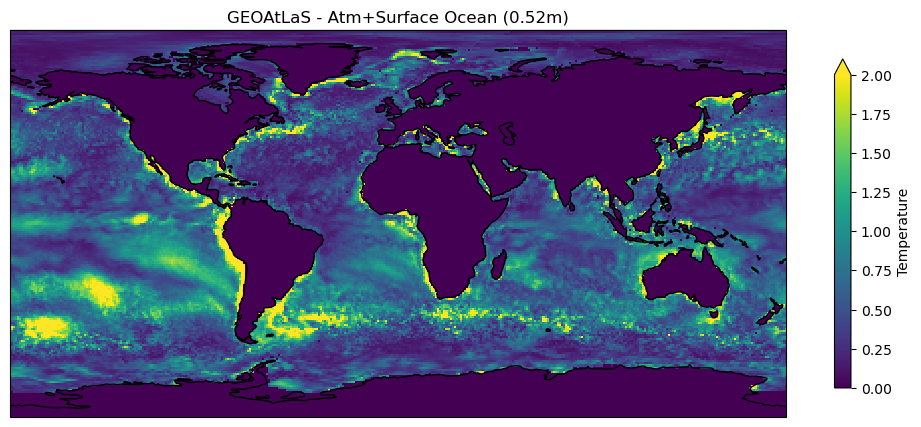

In [27]:
# spatial plot of RMSE error
mask = xr.where(targets.temp.isel(z_l=iz_l)==0, 0, 1)
sqerror = (targets.temp.isel(z_l=iz_l) - predictions.temp.isel(z_l=iz_l)*mask)**2
rmse_error = np.sqrt(sqerror.mean(dim=('lead_time','time')))
vmin=0; vmax = 2

# plot
kwargs = {"cbar_kwargs":{"orientation": "vertical", "shrink":0.7, "label":f"Temperature", "pad":0.05}, 
          "robust":True, "cmap":"viridis", "vmin":vmin, "vmax":vmax, "add_gridlines":False}
fig, ax = plot_map(rmse_error, **kwargs)
title = f"GEOAtLaS - Atm+Surface Ocean ({rmse_error.z_l.values:.2f}m)"
ax.set_title(title)
plt.tight_layout()
plt.show()

## Salinity

In [51]:
itime = 0 #np.random.randint(0, ds_pred.sizes["time"]) # randomly select an initialization time
ileadtime = -1
iz_l = 6
vmin=32; vmax=36
variable = "so"

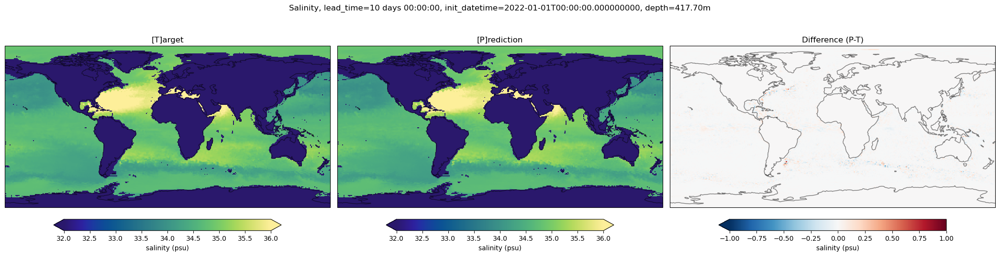

In [52]:
fig, axs = plt.subplots(1, 3, figsize=(21,5.5), subplot_kw=dict(projection=ccrs.PlateCarree()))
kwargs = {"cbar_kwargs":{"orientation": "horizontal", "shrink":0.7, "label":"salinity (psu)", "pad":0.05}, 
          "robust":True, "cmap":cm.haline, "vmin":vmin, "vmax":vmax,}

ocean_mask = xr.where(targets.so.isel(time=0, lead_time=0, z_l=iz_l)==0, 0, 1)

# target
target = targets[variable].isel(time=itime, lead_time=ileadtime, z_l=iz_l)*ocean_mask
target.plot(ax=axs[0], transform=ccrs.PlateCarree(), **kwargs)
axs[0].coastlines(alpha=0.5)
axs[0].set_title("[T]arget")

# prediction
prediction = predictions[variable].isel(time=itime, lead_time=ileadtime, z_l=iz_l)*ocean_mask
prediction.plot(ax=axs[1], transform=ccrs.PlateCarree(), **kwargs)
axs[1].coastlines(alpha=0.5)
axs[1].set_title("[P]rediction")

# difference
diff = prediction - target
kwargs["cmap"]="RdBu_r"
kwargs["vmin"]=-1
kwargs["vmax"]=1
diff.plot(ax=axs[2], transform=ccrs.PlateCarree(), **kwargs)
axs[2].coastlines(alpha=0.5)
axs[2].set_title("Difference (P-T)")

leadtime = pd.to_timedelta(predictions.coords["lead_time"][ileadtime].values, unit="D")
initdate = predictions.coords["time"][itime].values
plt.suptitle(f"Salinity, lead_time={leadtime}, init_datetime={initdate}, depth={predictions.z_l[iz_l].values:.2f}m")

plt.tight_layout()
#plt.savefig(os.path.join("figures", f"{variable}_ocn_only_R0_z_l-{predictions.z_l[iz_l].values:.2f}m.png"), dpi=300)
plt.show()

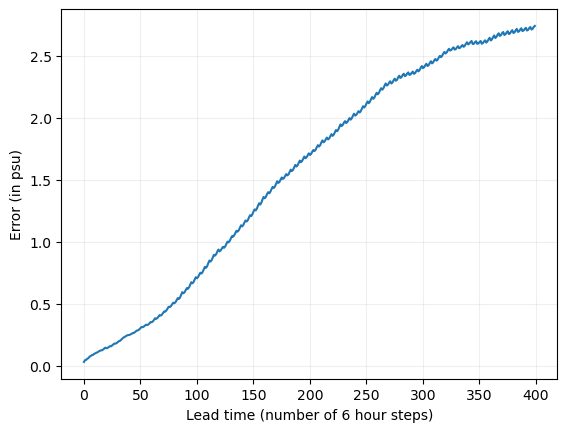

In [44]:
# compute rmse error vs lead time
mask = xr.where(targets.so.isel(z_l=iz_l)==0, 0, 1)
sqerror = (targets.so.isel(z_l=iz_l) - predictions.so.isel(z_l=iz_l)*mask)**2
plt.plot(np.sqrt(sqerror.mean(dim=('time','lat', 'lon'))))
plt.ylabel('Error (in psu)')
plt.xlabel('Lead time (number of 6 hour steps)')
plt.grid(alpha=0.2)
plt.show()

## Long Wave flux (LW)

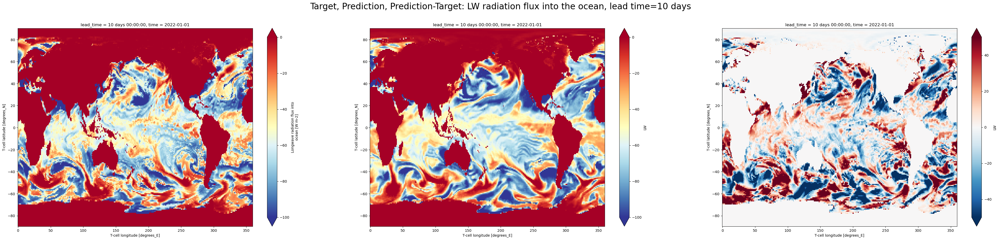

In [22]:
itime = 0
ilead = -1
vmin=-100
vmax=0

fig, ax = plt.subplots(1, 3, figsize=(50,10))
target = targets.LW.isel(time=itime, lead_time=ilead,)
mask = xr.where(target==0, 0, 1)
prediction = predictions.LW.isel(time=itime, lead_time=ilead,)*mask
diff = prediction - target

target.plot(ax=ax[0], vmin=vmin, vmax=vmax, cmap="RdYlBu_r")
prediction.plot(ax=ax[1], vmin=vmin, vmax=vmax, cmap="RdYlBu_r")
diff.plot(ax=ax[2], vmin=-50, vmax=50, cmap='RdBu_r')

lead_time_days = predictions.lead_time[-1].values.astype('timedelta64[D]')
plt.suptitle(f'Target, Prediction, Prediction-Target: LW radiation flux into the ocean, lead time={lead_time_days}', fontsize=24)
plt.show()

## Short Wave (SW) fluxes

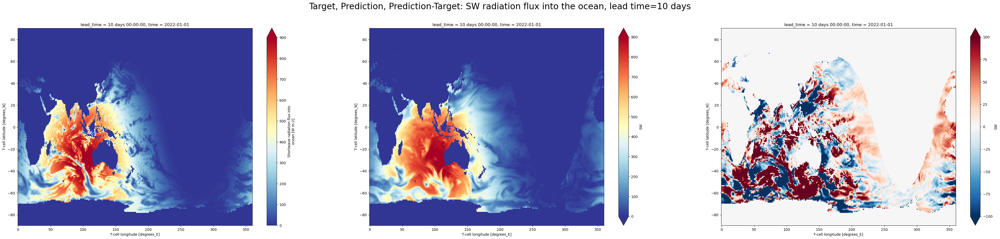

In [24]:
itime = 0
ilead = -1
vmin=0
vmax=900

fig, ax = plt.subplots(1, 3, figsize=(50,10))
target = targets.SW.isel(time=itime, lead_time=ilead,)
mask = xr.where(target==0, 0, 1)
prediction = predictions.SW.isel(time=itime, lead_time=ilead,)*mask
diff = prediction - target

target.plot(ax=ax[0], vmin=vmin, vmax=vmax, cmap="RdYlBu_r")
prediction.plot(ax=ax[1], vmin=vmin, vmax=vmax, cmap="RdYlBu_r")
diff.plot(ax=ax[2], vmin=-100, vmax=100, cmap='RdBu_r')

lead_time_days = predictions.lead_time[-1].values.astype('timedelta64[D]')
plt.suptitle(f'Target, Prediction, Prediction-Target: SW radiation flux into the ocean, lead time={lead_time_days}', fontsize=24)
plt.show()

## u current velocity

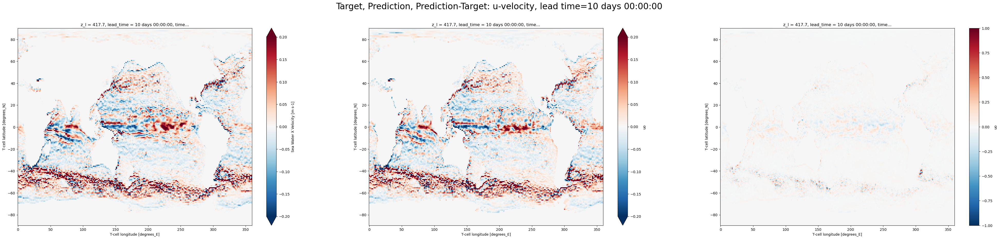

In [60]:
itime = 0
ilead = -1
iz_l = 6
vmin = -0.2; vmax = 0.2

fig, ax = plt.subplots(1, 3, figsize=(50,10))
target = targets.uo.isel(time=itime, lead_time=ilead, z_l=iz_l)
mask = xr.where(target==0, 0, 1)
prediction = predictions.uo.isel(time=itime, lead_time=ilead, z_l=iz_l)*mask
diff = prediction - target

target.plot(ax=ax[0], vmin=vmin, vmax=vmax, cmap="RdBu_r")
prediction.plot(ax=ax[1], vmin=vmin, vmax=vmax, cmap="RdBu_r",)
diff.plot(ax=ax[2], vmin=-1, vmax=1, cmap='RdBu_r')

lead_time_days = pd.to_timedelta(prediction.lead_time.values, unit="D")
plt.suptitle(f'Target, Prediction, Prediction-Target: u-velocity, lead time={lead_time_days}', fontsize=24)
plt.show()

## v current velocity

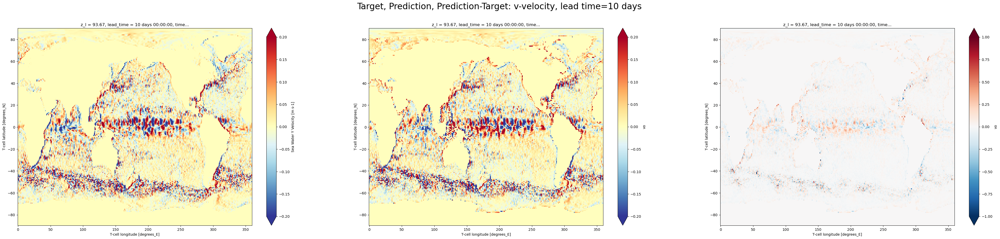

In [64]:
itime = 0
ilead = -1
iz_l = 3
vmin = -0.2
vmax = 0.2

fig, ax = plt.subplots(1, 3, figsize=(50,10))
target = targets.vo.isel(time=itime, lead_time=ilead, z_l=iz_l)
mask = xr.where(target==0, 0, 1)
prediction = predictions.vo.isel(time=itime, lead_time=ilead, z_l=iz_l)*mask
diff = prediction - target

target.plot(ax=ax[0], vmin=vmin, vmax=vmax, cmap="RdYlBu_r")
prediction.plot(ax=ax[1], vmin=vmin, vmax=vmax, cmap="RdYlBu_r")
diff.plot(ax=ax[2], vmin=-1, vmax=1, cmap='RdBu_r')

lead_time_days = predictions.lead_time[-1].values.astype('timedelta64[D]')
plt.suptitle(f'Target, Prediction, Prediction-Target: v-velocity, lead time={lead_time_days}', fontsize=24)
plt.show()

## Current speed

In [65]:
itime = 0
ilead = -1
iz_l = 0

cspeed_target = np.sqrt(np.square(targets.uo.isel(time=itime, lead_time=ilead, z_l=iz_l)) 
                        + np.square(targets.vo.isel(time=itime, lead_time=ilead, z_l=iz_l)))
mask = xr.where(cspeed_target==0, 0, 1)
cspeed_prediction = np.sqrt(np.square(predictions.uo.isel(time=itime, lead_time=ilead, z_l=iz_l)) 
                        + np.square(predictions.vo.isel(time=itime, lead_time=ilead, z_l=iz_l)))*mask
diff = cspeed_prediction - cspeed_target

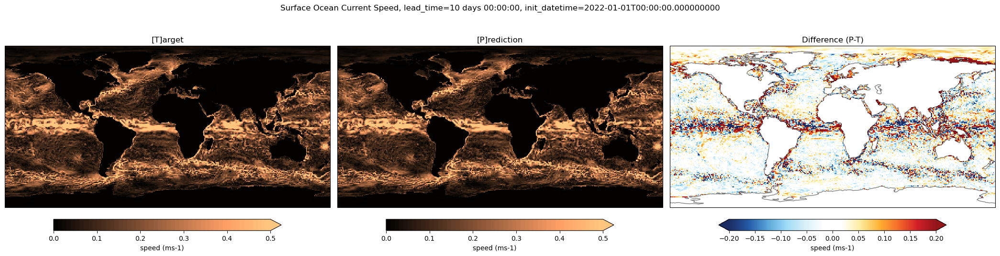

In [66]:
fig, axs = plt.subplots(1, 3, figsize=(21,5.5), subplot_kw=dict(projection=ccrs.PlateCarree()))
vmin = 0
vmax = 0.5
kwargs = {"cbar_kwargs":{"orientation": "horizontal", "shrink":0.7, "label":"speed (ms-1)", "pad":0.05}, 
          "robust":True, "cmap":cm.GMT_copper, "vmin":vmin, "vmax":vmax,}

# target
cspeed_target.plot(ax=axs[0], transform=ccrs.PlateCarree(), **kwargs)
axs[0].coastlines(alpha=0.5)
axs[0].set_title("[T]arget")

# prediction
cspeed_target.plot(ax=axs[1], transform=ccrs.PlateCarree(), **kwargs)
axs[1].coastlines(alpha=0.5)
axs[1].set_title("[P]rediction")

# difference
kwargs["cmap"]=cm.BlueWhiteOrangeRed
kwargs["vmin"]=-0.2
kwargs["vmax"]=0.2
diff.plot(ax=axs[2], transform=ccrs.PlateCarree(), **kwargs)
axs[2].coastlines(alpha=0.5)
axs[2].set_title("Difference (P-T)")

leadtime = pd.to_timedelta(prediction.lead_time.values, unit="D")
plt.suptitle(f"Surface Ocean Current Speed, lead_time={leadtime}, init_datetime={prediction.time.values}")
plt.tight_layout()
plt.show()

## Sea Ice Concentration

In [31]:
ilead = -1
lead_time_days = predictions.lead_time[ilead].values.astype('timedelta64[D]')

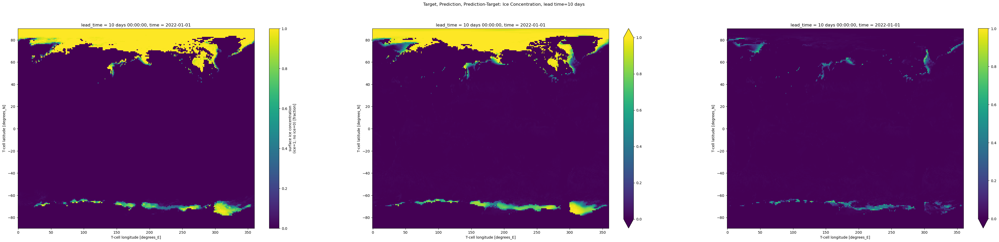

In [37]:
fig, ax = plt.subplots(1,3, figsize=(50, 10))
kwargs = {"cmap":"viridis", "vmin":0, "vmax":1}
pred = predictions.icec.isel(time=0, lead_time=ilead)*(1-atm.land_static.rename({"grid_yt":"lat", "grid_xt":"lon"}))
target = targets.icec.isel(time=0, lead_time=ilead)
diff = pred - target

target.plot(ax=ax[0], **kwargs,)
pred.plot(ax=ax[1], **kwargs,)
diff.plot(ax=ax[2], **kwargs)
plt.suptitle(f'Target, Prediction, Prediction-Target: Ice Concentration, lead time={lead_time_days}')
plt.show()

## Sea Ice Thickness

In [38]:
itime = 0
ileadtime = -1
lead_time_days = predictions.lead_time[-1].values.astype('timedelta64[D]')
variable = "icetk"

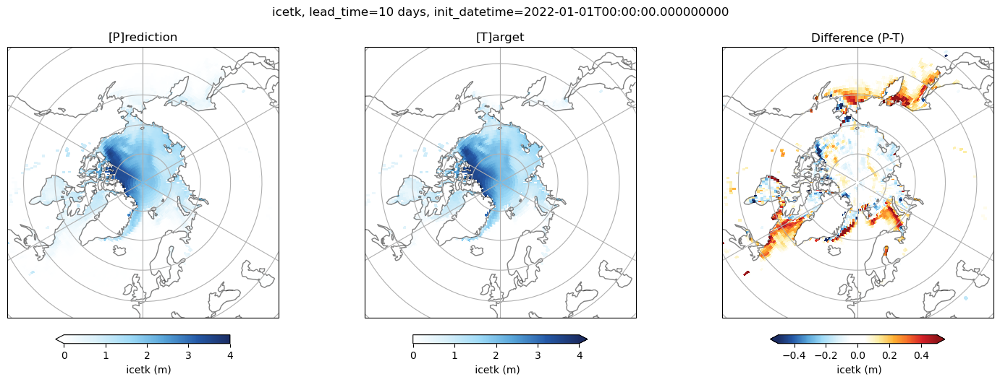

In [40]:
# North Pole
fig, axs = plt.subplots(1, 3, figsize=(15,5.5), subplot_kw=dict(projection=ccrs.NorthPolarStereo()))
kwargs = {"cbar_kwargs":{"orientation": "horizontal", "shrink":0.5, "label":" icetk (m)", "pad":0.05}, 
          "robust":True, "cmap":cm.WhiteBlue, "vmin":0, "vmax":4,}

ocean_mask = 1-atm.land_static.rename({"grid_yt":"lat", "grid_xt":"lon"})
# prediction
prediction = predictions[variable].isel(time=itime, lead_time=ileadtime).where(ocean_mask)
prediction.plot(ax=axs[0], transform=ccrs.PlateCarree(), **kwargs)
axs[0].set_extent([0, 360, 45, 90], crs=ccrs.PlateCarree())
axs[0].coastlines(alpha=0.5)
axs[0].gridlines()
axs[0].set_title("[P]rediction")

# target
target = targets[variable].isel(time=itime, lead_time=ileadtime).where(ocean_mask)
target.plot(ax=axs[1], transform=ccrs.PlateCarree(), **kwargs)
axs[1].set_extent([0, 360, 45, 90], crs=ccrs.PlateCarree())
axs[1].coastlines(alpha=0.5)
axs[1].gridlines()
axs[1].set_title("[T]arget")

# difference
diff = prediction - target
kwargs["cmap"]=cm.BlueWhiteOrangeRed
kwargs["vmin"]=-0.5
kwargs["vmax"]=0.5
diff.plot(ax=axs[2], transform=ccrs.PlateCarree(), **kwargs)
axs[2].set_extent([0, 360, 45, 90], crs=ccrs.PlateCarree())
axs[2].coastlines(alpha=0.5)
axs[2].gridlines()
axs[2].set_title("Difference (P-T)")

leadtime = pd.to_timedelta(prediction.lead_time.values, unit="D")
plt.suptitle(f"{variable}, lead_time={lead_time_days}, init_datetime={prediction.time.values}")
plt.tight_layout()
#plt.savefig(os.path.join(_figdir, f"{variable}_{_prototype}_{_expt}_north_pole.png"), dpi=300)
plt.show()

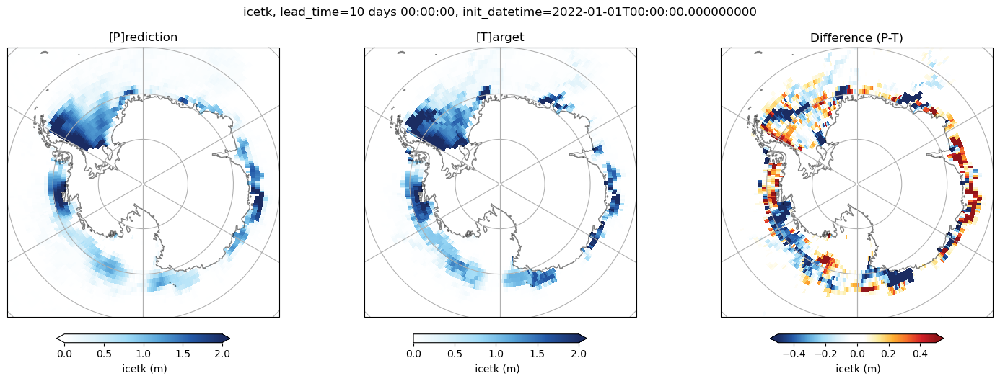

In [41]:
# South Pole
fig, axs = plt.subplots(1, 3, figsize=(15,5.5), subplot_kw=dict(projection=ccrs.SouthPolarStereo()))
kwargs = {"cbar_kwargs":{"orientation": "horizontal", "shrink":0.5, "label":" icetk (m)", "pad":0.05}, 
          "robust":True, "cmap":cm.WhiteBlue, "vmin":0, "vmax":2,}

# prediction
ocean_mask = 1-atm.land_static.rename({"grid_yt":"lat", "grid_xt":"lon"})
prediction = predictions[variable].isel(time=itime, lead_time=ileadtime).where(ocean_mask)
prediction.plot(ax=axs[0], transform=ccrs.PlateCarree(), **kwargs)
axs[0].set_extent([0, 360, -60, -90], crs=ccrs.PlateCarree())
axs[0].coastlines(alpha=0.5)
axs[0].gridlines()
axs[0].set_title("[P]rediction")

# target
target = targets[variable].isel(time=itime, lead_time=ileadtime).where(ocean_mask)
target.plot(ax=axs[1], transform=ccrs.PlateCarree(), **kwargs)
axs[1].set_extent([0, 360, -60, -90], crs=ccrs.PlateCarree())
axs[1].coastlines(alpha=0.5)
axs[1].gridlines()
axs[1].set_title("[T]arget")

# difference
diff = prediction - target
kwargs["cmap"]=cm.BlueWhiteOrangeRed
kwargs["vmin"]=-0.5
kwargs["vmax"]=0.5
diff.plot(ax=axs[2], transform=ccrs.PlateCarree(), **kwargs)
axs[2].set_extent([0, 360, -60, -90], crs=ccrs.PlateCarree())
axs[2].coastlines(alpha=0.5)
axs[2].gridlines()
axs[2].set_title("Difference (P-T)")

leadtime = pd.to_timedelta(prediction.lead_time.values, unit="D")
plt.suptitle(f"{variable}, lead_time={leadtime}, init_datetime={prediction.time.values}")
plt.tight_layout()
#plt.savefig(os.path.join(_figdir, f"{variable}_{_prototype}_{_expt}_south_pole.png"), dpi=300)
plt.show()

## Soil Moisture

In [ ]:
itime = np.random.randint(0, ds_pred.sizes["time"]) # randomly select an initialization time
ileadtime = -1
leadtime = 
variable = "soilm"

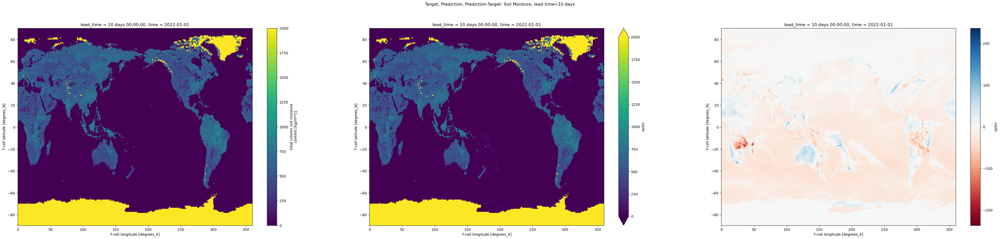

In [36]:
fig, ax = plt.subplots(1, 3, figsize=(50,10))
vmin=0; vmax=2000
targets.soilm.isel(time=0, lead_time=-1).plot(ax=ax[0], cmap="viridis", vmin=vmin, vmax=vmax)
predictions.soilm.isel(time=0, lead_time=-1).plot(ax=ax[1], cmap="viridis", vmin=vmin, vmax=vmax)
diff = predictions.soilm.isel(time=0, lead_time=-1) - targets.soilm.isel(time=0, lead_time=-1)
diff.plot(ax=ax[2], cmap='RdBu')

plt.suptitle(f'Target, Prediction, Prediction-Target: Soil Moisture, lead time={lead_time_days}')
plt.show()

## Animation on revolving sphere

### single plot

lead time = 0 days 06:00:00
lead time = 0 days 06:00:00
lead time = 0 days 12:00:00
lead time = 0 days 18:00:00
lead time = 1 days 00:00:00


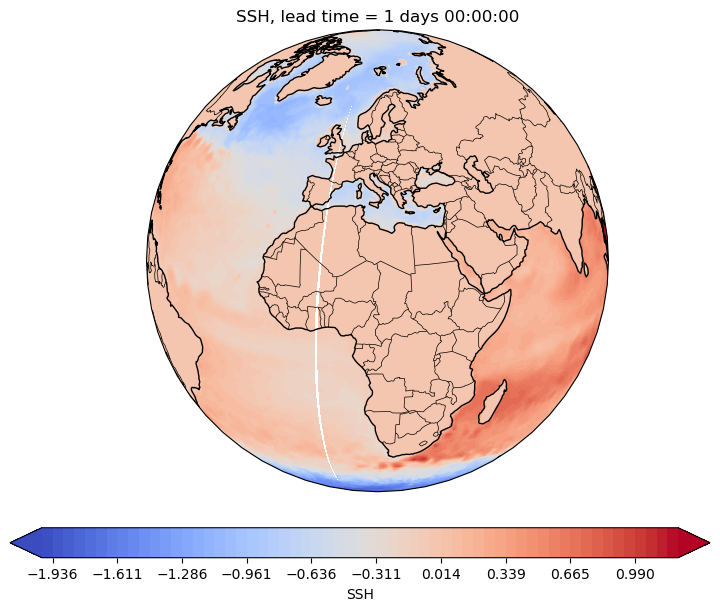

In [36]:
%matplotlib inline
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.animation import FuncAnimation 
from IPython.display import HTML
import pandas as pd

# set the data, coords, and framecount
variable = "SSH"
vcoord = "z_l"
itime = 0
ilevel = 0

if vcoord in predictions[variable].coords:
    da = predictions[variable].isel({"time":itime, vcoord:ilevel, "lead_time":slice(None, 4)})
else:
    da = predictions[variable].isel(time=itime, lead_time=slice(None, 4))

lons = da["lon"]
lats = da["lat"]
times = da["lead_time"]

# Meshgrid for contourf
lon2d, lat2d = np.meshgrid(lons, lats)

# Create figure
fig, ax = plt.subplots(1, 1, figsize=(14, 6),
                        subplot_kw={'projection': ccrs.Orthographic(central_longitude=0.0, central_latitude=23.5)})

# Create a colorbar axis
cbar_ax = fig.add_axes([0.25, 0., 0.5, 0.05])  # [left, bottom, width, height]

# Set color levels manually for consistent coloring
vmin = da.min().item()
vmax = da.max().item()
clevs = np.linspace(vmin, vmax, 60)

# Create a placeholder for colorbar (will update in first frame)
first_cf = None

#plt.close(fig)

# Update function for animation
def update(frame):
    ax.clear()
    
    central_lon = (frame * 5) % 360

    # Plot
    proj = ccrs.Orthographic(central_longitude=central_lon, central_latitude=23.5)
    ax.projection = proj
    ax.set_global()
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, linewidth=0.5)
    cf = ax.contourf(lon2d, lat2d, da.isel(lead_time=frame), clevs,
                     transform=ccrs.PlateCarree(), cmap="coolwarm", extend='both')

    global first_cf
    if first_cf is None:
        first_cf = cf
        # Create a colorbar only once
        cbar = fig.colorbar(cf, cax=cbar_ax, orientation='horizontal', label=f'{variable}')
        cbar.ax.tick_params(labelsize=10)

    leadtime = pd.to_timedelta(times[frame].values, unit="D")
    print(f"lead time = {leadtime}")
    ax.set_title(f"{variable}, lead time = {leadtime}", fontsize=12)

    return []

# Animate
ani = FuncAnimation(fig, update, frames=len(times), interval=200, blit=False)
HTML(ani.to_jshtml())
plt.show()

In [69]:
%matplotlib notebook

import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# set the data, coords, and framecount
variable = "SSH"
vcoord = "z_l"
itime = 0
ilevel = 0
if vcoord in predictions[variable].coords:
    da = predictions[variable].isel({"time":itime, vcoord:ilevel, "lead_time":slice(None, 4)})
else:
    da = predictions[variable].isel(time=itime, lead_time=slice(None, 4))

lons = da["lon"]
lats = da["lat"]
times = da["lead_time"]

lon2d, lat2d = np.meshgrid(lons, lats)
frame_count = len(times)

# Set up figure and axis once
fig, ax = plt.subplots(figsize=(10, 8),
                       subplot_kw={'projection': ccrs.Orthographic(central_longitude=0.0, central_latitude=23.5)})

# Set global vmin and vmax
vmin = -0.8
vmax = 0.8
norm = Normalize(vmin=vmin, vmax=vmax)
cmap = "coolwarm"

# Create ScalarMappable for colorbar
sm = ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])  # Required for colorbar to work

def update(frame):
    
    fig.clf()  # Clear entire figure

    central_lon = (frame * 5) % 360

    # Create a new fresh axis with rotated projection
    ax = plt.axes(projection=ccrs.Orthographic(central_longitude=central_lon, central_latitude=23.5))
    ax.set_global()
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, linewidth=0.1)

    # Plot data
    cf = ax.contourf(lon2d, lat2d, da.isel(lead_time=frame), 60,
                     transform=ccrs.PlateCarree(), cmap=cmap, vmin=vmin, vmax=vmax)
    # Add colorbar
    cbar = fig.colorbar(sm, ax=ax, orientation="horizontal", fraction=0.046, pad=0.04)
    cbar.set_label(f"{variable}")

    leadtime = pd.to_timedelta(times[frame].values, unit="D")
    print(f"lead time = {leadtime}")
    ax.set_title(f"{variable}, lead time = {leadtime}", fontsize=12)

    return []

ani = FuncAnimation(fig, update, frames=frame_count, interval=500, blit=False)
ani.save(f"figures/{variable}_predictions.mp4", writer="ffmpeg", fps=20, dpi=150)

HTML(ani.to_jshtml())

<IPython.core.display.Javascript object>

lead time = 0 days 06:00:00
lead time = 0 days 06:00:00
lead time = 0 days 12:00:00
lead time = 0 days 18:00:00
lead time = 1 days 00:00:00
lead time = 0 days 06:00:00
lead time = 0 days 06:00:00
lead time = 0 days 12:00:00
lead time = 0 days 18:00:00
lead time = 1 days 00:00:00


### double plot

In [18]:
%matplotlib notebook

import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import pandas as pd

# set the data, coords, and framecount
variable = "temp"
long_name = "SST"
vcoord = "z_l"
itime = 0
ilevel = 0

if vcoord in predictions[variable].coords:
    prediction = predictions[variable].isel({"time":itime, vcoord:ilevel,})
    target = targets[variable].isel({"time":itime, vcoord:ilevel,})
else:
    prediction = predictions[variable].isel(time=itime,)
    target = targets[variable].isel(time=itime,)

lons = prediction["lon"]
lats = prediction["lat"]
times = prediction["lead_time"]

lon2d, lat2d = np.meshgrid(lons, lats)
central_lat_init = 5
central_lon_init = -50

# Create figure
fig, axs = plt.subplots(1, 2, figsize=(14, 8.5),
                        subplot_kw={'projection': ccrs.Orthographic(central_longitude=-98, central_latitude=39.0)})

# Create a shared colorbar axis
cbar_ax = fig.add_axes([0.25, 0.04, 0.5, 0.03])  # [left, bottom, width, height]

# Set color levels manually for consistent coloring
vmin = target.min().item()
vmax = target.max().item()
clevs = np.linspace(vmin, vmax, 60)

# Create a placeholder for colorbar (will update in first frame)
first_cf = None

# Set global vmin and vmax
vmin = -2
vmax = 30
norm = Normalize(vmin=vmin, vmax=vmax)
cmap = cm.WhiteBlueGreenYellowRed

# Create ScalarMappable for colorbar
sm = ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])  # Required for colorbar to work

#plt.close(fig)

def update(frame):
    fig.subplots_adjust(wspace=0.05, hspace=0.05)

    for ax in axs:
        ax.clear()

    # Compute new central longitude and latitude
    central_lon = (central_lon_init - frame * 2) % 360  # Rotate longitude faster
    central_lat = central_lat_init #+ 30 * np.sin(np.radians(frame * 2))  # Oscillate latitude between -20 and +20 degrees

    
    # Left Globe -- Prediction
    ax_left = axs[0]
    proj_left = ccrs.Orthographic(central_longitude=central_lon, central_latitude=central_lat)
    ax_left.projection = proj_left
    ax_left.set_global()
    ax_left.coastlines()
    ax_left.add_feature(cfeature.BORDERS, linewidth=0.5)
    cf_left = ax_left.contourf(lon2d, lat2d, prediction.isel(lead_time=frame), clevs,
                               transform=ccrs.PlateCarree(), cmap=cmap, vmin=vmin, vmax=vmax, 
                               extend='both')

    # Right Globe -- Target
    ax_right = axs[1]
    proj_right = ccrs.Orthographic(central_longitude=central_lon, central_latitude=central_lat)
    ax_right.projection = proj_right
    ax_right.set_global()
    ax_right.coastlines()
    ax_right.add_feature(cfeature.BORDERS, linewidth=0.5)
    cf_right = ax_right.contourf(lon2d, lat2d, target.isel(lead_time=frame), clevs,
                                 transform=ccrs.PlateCarree(), cmap=cmap, vmin=vmin, vmax=vmax,
                                 extend='both')

    global first_cf
    if first_cf is None:
        first_cf = cf_left
        # Create a colorbar only once
        cbar = fig.colorbar(sm, cax=cbar_ax, orientation="horizontal",)
        cbar.set_label(f"{variable}")
        cbar.ax.tick_params(labelsize=10)
        #------
        #cbar = fig.colorbar(first_cf, cax=cbar_ax, orientation='horizontal', label=f'{variable}')
        

    axs[0].set_title('Prediction', fontsize=12)
    axs[1].set_title('Target', fontsize=12)

    leadtime = pd.to_timedelta(times[frame].values, unit="D")
    print(f"lead time = {leadtime}")
    if long_name is not None:
        plt.suptitle(f"{long_name}, lead time = {leadtime}")
    else:
        plt.suptitle(f"{variable}, lead time = {leadtime}")

    return []

# Animate
ani = FuncAnimation(fig, update, frames=len(times), interval=500, blit=False)
ani.save(f"figures/{variable}_predictions_targets_atm_wocnsfc_R0.mp4", writer='ffmpeg', fps=10, dpi=200) # use fps=20 for atm

# Display animation
#HTML(ani.to_jshtml())

<IPython.core.display.Javascript object>

lead time = 0 days 06:00:00
lead time = 0 days 06:00:00
lead time = 0 days 12:00:00
lead time = 0 days 18:00:00
lead time = 1 days 00:00:00
lead time = 1 days 06:00:00
lead time = 1 days 12:00:00
lead time = 1 days 18:00:00
lead time = 2 days 00:00:00
lead time = 2 days 06:00:00
lead time = 2 days 12:00:00
lead time = 2 days 18:00:00
lead time = 3 days 00:00:00
lead time = 3 days 06:00:00
lead time = 3 days 12:00:00
lead time = 3 days 18:00:00
lead time = 4 days 00:00:00
lead time = 4 days 06:00:00
lead time = 4 days 12:00:00
lead time = 4 days 18:00:00
lead time = 5 days 00:00:00
lead time = 5 days 06:00:00
lead time = 5 days 12:00:00
lead time = 5 days 18:00:00
lead time = 6 days 00:00:00
lead time = 6 days 06:00:00
lead time = 6 days 12:00:00
lead time = 6 days 18:00:00
lead time = 7 days 00:00:00
lead time = 7 days 06:00:00
lead time = 7 days 12:00:00
lead time = 7 days 18:00:00
lead time = 8 days 00:00:00
lead time = 8 days 06:00:00
lead time = 8 days 12:00:00
lead time = 8 days 1